In [1]:
import lcmsanalysis as la
import pandas as pd
import pickle
import os
from multiprocessing import Pool
import matplotlib.pyplot as plt
import tqdm

import enzymeplots as dp
import enzymeanalysis as da

/home/eglassey/.local/lib/python3.7/site-packages/Bio/SubsMat/__init__.py:131: BiopythonDeprecationWarning: Bio.SubsMat has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.substitution_matrices as a replacement, and contact the Biopython developers if you still need the Bio.SubsMat module.
  BiopythonDeprecationWarning,


# Import the excel file that has all the extract metadata

In [2]:
ex = pd.read_excel("./extracts_tgn.xlsx")

# Change the directories, if applicable, to where the qqq and qtof mzxml files are stored

In [3]:
qqq_mzxml_directory = "./mzxml_qqq/"
qtof_mzxml_directory = "./mzxml_qtof/"

qqq_extract_files = dict([(int(f.split("_")[0]), f) for f in
            os.listdir(qqq_mzxml_directory) if "mzdata" in f])
qtof_extract_files = dict([(int(f.split("_")[0]), f) for f in
            os.listdir(qtof_mzxml_directory) if "mzdata" in f])

In [4]:
def attach_files(x):
    extract_num = int(x['extract'])
    if x['ms'] == 'qqq':
        filepath = qqq_mzxml_directory + qqq_extract_files[extract_num]
    elif x['ms'] == 'qtof':
        filepath = qtof_mzxml_directory + qtof_extract_files[extract_num]
    else:
        print('error: {}'.format(extract_num))
        return None
    return filepath

In [5]:
ex['mzxml_file'] = ex.apply(attach_files, axis=1)

In [6]:
extracts = []
for row in ex.iterrows():
    sample = dict(row[1])
    extracts.append(sample)

# Update processes=X to the number of threads the computer can support

In [7]:
all_all_peaks = []
num_extracts = len(extracts)
with Pool(processes=20) as p:
    with tqdm.tqdm(total=num_extracts) as pbar:
        for p in p.imap(la.analyze_extract, extracts):
            pbar.update(1)
            all_all_peaks.append(p)

  0%|          | 0/591 [00:00<?, ?it/s]

NO PEAK:  mod  in  5091
NO PEAK:  mod  in  5093
Extract: 5115; 3 of 3 Peaks
Extract: 5104; 3 of 3 Peaks
NO PEAK:  other  in  5091
Extract: 5094; 3 of 3 Peaks
Extract: 5091; 1 of 3 Peaks
Extract: 5119; 3 of 3 Peaks
NO PEAK:  other  in  5093
Extract: 5093; 1 of 3 Peaks
Extract: 5121; 3 of 3 Peaks
Extract: 5100; 3 of 3 Peaks
Extract: 5116; 3 of 3 Peaks
Extract: 5095; 3 of 3 Peaks
Extract: 5098; 3 of 3 Peaks
Extract: 5102; 3 of 3 Peaks
Extract: 5103; 3 of 3 Peaks
Extract: 5092; 3 of 3 Peaks
Extract: 5097; 3 of 3 Peaks
Extract: 5096; 3 of 3 Peaks
Extract: 5099; 3 of 3 Peaks
Extract: 5120; 3 of 3 Peaks
Extract: 5101; 3 of 3 Peaks
Extract: 5054; 3 of 3 Peaks


  0%|          | 1/591 [00:17<2:56:57, 18.00s/it]

NO PEAK:  mod  in  5141
Extract: 5141; 2 of 3 Peaks
Extract: 5140; 3 of 3 Peaks
Extract: 5130; 3 of 3 Peaks
Extract: 5136; 3 of 3 Peaks
Extract: 5122; 3 of 3 Peaks


  4%|▎         | 21/591 [00:25<2:00:43, 12.71s/it]

Extract: 5135; 3 of 3 Peaks
Extract: 5129; 3 of 3 Peaks
Extract: 5123; 3 of 3 Peaks


  4%|▎         | 22/591 [00:25<1:24:59,  8.96s/it]

NO PEAK:  mod  in  5280
Extract: 5137; 3 of 3 Peaks
Extract: 5283; 3 of 3 Peaks
NO PEAK:  other  in  5281
Extract: 5279; 3 of 3 Peaks
Extract: 5281; 2 of 3 Peaks
Extract: 5132; 3 of 3 Peaks
NO PEAK:  other  in  5280
Extract: 5280; 1 of 3 Peaks
Extract: 5242; 3 of 3 Peaks
Extract: 5282; 3 of 3 Peaks
Extract: 5131; 3 of 3 Peaks


  4%|▍         | 25/591 [00:27<1:00:39,  6.43s/it]

Extract: 5284; 3 of 3 Peaks
Extract: 5285; 3 of 3 Peaks
Extract: 5290; 3 of 3 Peaks
Extract: 5288; 3 of 3 Peaks
Extract: 5286; 3 of 3 Peaks
Extract: 5309; 3 of 3 Peaks
Extract: 5287; 3 of 3 Peaks
Extract: 5304; 3 of 3 Peaks
Extract: 5311; 3 of 3 Peaks
Extract: 5292; 3 of 3 Peaks
Extract: 5310; 3 of 3 Peaks
Extract: 5289; 3 of 3 Peaks
Extract: 5303; 3 of 3 Peaks
Extract: 5308; 3 of 3 Peaks
Extract: 5291; 3 of 3 Peaks
Extract: 5307; 3 of 3 Peaks
Extract: 5317; 3 of 3 Peaks
Extract: 5318; 3 of 3 Peaks
Extract: 5320; 3 of 3 Peaks
Extract: 5319; 3 of 3 Peaks
Extract: 5322; 3 of 3 Peaks
NO PEAK:  mod  in  5328
Extract: 5323; 3 of 3 Peaks
NO PEAK:  other  in  5469
Extract: 5468; 3 of 3 Peaks
Extract: 5469; 2 of 3 Peaks
Extract: 5328; 2 of 3 Peaks
Extract: 5325; 3 of 3 Peaks
NO PEAK:  mod  in  5329
NO PEAK:  mod  in  5467
NO PEAK:  mod  in  5324
Extract: 5430; 3 of 3 Peaks
Extract: 5329; 2 of 3 Peaks
NO PEAK:  other  in  5467
Extract: 5474; 3 of 3 Peaks
Extract: 5467; 1 of 3 Peaks
Extract: 532

  5%|▍         | 27/591 [01:09<1:41:42, 10.82s/it]

Extract: 5495; 3 of 3 Peaks
Extract: 5506; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9355
NO PEAK:  mod  in  5511
Extract: 5480; 3 of 3 Peaks


 13%|█▎        | 79/591 [01:09<1:04:39,  7.58s/it]

Extract: 5492; 3 of 3 Peaks


 14%|█▍        | 83/591 [01:10<45:11,  5.34s/it]  

Extract: 5497; 3 of 3 Peaks
Extract: 5498; 3 of 3 Peaks
Extract: 5499; 3 of 3 Peaks


 15%|█▍        | 86/591 [01:10<31:36,  3.76s/it]

Extract: 5511; 2 of 3 Peaks
NO PEAK:  mod  in  5516
Extract: 5505; 3 of 3 Peaks
Extract: 5508; 3 of 3 Peaks
Extract: 5516; 2 of 3 Peaks
NO PEAK:  other  in  5510
Extract: 5510; 2 of 3 Peaks
NO PEAK:  mod  in  5517
Extract: 5507; 3 of 3 Peaks


 15%|█▌        | 89/591 [01:12<24:04,  2.88s/it]

Extract: 5513; 3 of 3 Peaks
NO PEAK:  other  in  5517
Extract: 5517; 1 of 3 Peaks
Extract: 5512; 3 of 3 Peaks


 16%|█▌        | 93/591 [01:13<17:16,  2.08s/it]

Extract: 9349; 3 of 3 Peaks


 17%|█▋        | 98/591 [01:15<12:49,  1.56s/it]

Row is not formatted properly.... No Mass:  9371
Extract: 9351; 3 of 3 Peaks


 17%|█▋        | 100/591 [01:21<16:17,  1.99s/it]

Extract: 9352; 3 of 3 Peaks


 17%|█▋        | 101/591 [01:23<16:00,  1.96s/it]

Extract: 9357; 3 of 3 Peaks
Extract: 9359; 3 of 3 Peaks
Extract: 9360; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9377
Extract: 9362; 3 of 3 Peaks
Extract: 9356; 3 of 3 Peaks
Extract: 9354; 3 of 3 Peaks
Extract: 9353; 3 of 3 Peaks


 17%|█▋        | 102/591 [01:25<17:18,  2.12s/it]

Extract: 9358; 3 of 3 Peaks


 18%|█▊        | 107/591 [01:26<12:04,  1.50s/it]

NO PEAK:  mod  in  9364
Extract: 9361; 3 of 3 Peaks


 19%|█▊        | 110/591 [01:26<09:06,  1.14s/it]

Extract: 9363; 3 of 3 Peaks


 19%|█▉        | 112/591 [01:27<06:40,  1.20it/s]

Row is not formatted properly.... No Mass:  9385
Row is not formatted properly.... No Mass:  9386
Extract: 9364; 2 of 3 Peaks
Extract: 9366; 3 of 3 Peaks
Extract: 9369; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9389
Row is not formatted properly.... No Mass:  9390
Extract: 9367; 3 of 3 Peaks
Extract: 9365; 3 of 3 Peaks


 19%|█▉        | 114/591 [01:28<06:00,  1.32it/s]

Extract: 9370; 3 of 3 Peaks
Extract: 9368; 3 of 3 Peaks


 20%|█▉        | 117/591 [01:29<04:45,  1.66it/s]

Extract: 9372; 3 of 3 Peaks


 20%|██        | 121/591 [01:30<04:02,  1.94it/s]

Extract: 9373; 3 of 3 Peaks


 21%|██        | 122/591 [01:34<12:25,  1.59s/it]

Extract: 9381; 3 of 3 Peaks
Extract: 9374; 3 of 3 Peaks


 21%|██        | 123/591 [01:38<18:14,  2.34s/it]

Row is not formatted properly.... No Mass:  9400
Row is not formatted properly.... No Mass:  9401
Extract: 9375; 3 of 3 Peaks


 21%|██        | 124/591 [01:38<13:05,  1.68s/it]

Extract: 9382; 3 of 3 Peaks
Extract: 9378; 3 of 3 Peaks
Extract: 9379; 3 of 3 Peaks
Extract: 9380; 3 of 3 Peaks
Extract: 9391; 3 of 3 Peaks
Extract: 9383; 3 of 3 Peaks
Extract: 9392; 3 of 3 Peaks
Extract: 9384; 3 of 3 Peaks
Extract: 9376; 3 of 3 Peaks


 21%|██        | 125/591 [01:41<15:35,  2.01s/it]

Extract: 9388; 3 of 3 Peaks
Extract: 9387; 3 of 3 Peaks


 23%|██▎       | 136/591 [01:42<10:47,  1.42s/it]

Row is not formatted properly.... No Mass:  9414
Extract: 9395; 3 of 3 Peaks
Extract: 9396; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9416
Extract: 9397; 3 of 3 Peaks
Extract: 9394; 3 of 3 Peaks
Extract: 9398; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9421
Extract: 9399; 3 of 3 Peaks
Extract: 9407; 3 of 3 Peaks
Extract: 9408; 3 of 3 Peaks
Extract: 9419; 3 of 3 Peaks
Extract: 9404; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9426
Extract: 9406; 3 of 3 Peaks
Extract: 9403; 3 of 3 Peaks
Extract: 9405; 3 of 3 Peaks
Extract: 9402; 3 of 3 Peaks
Extract: 9411; 3 of 3 Peaks
Extract: 9409; 3 of 3 Peaks
Extract: 9410; 3 of 3 Peaks
Extract: 9417; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9436
Extract: 9412; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  9438
Row is not formatted properly.... No Mass:  9439
Extract: 9415; 3 of 3 Peaks
Extract: 9413; 3 of 3 Peaks
Extract: 9418; 3 of 3 Peaks
Extract: 9420; 3 of 3 Peaks
Row is not fo

Extract: 11380; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  11399
Extract: 11382; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  11401
Extract: 11383; 3 of 3 Peaks
Extract: 11385; 3 of 3 Peaks
Extract: 11384; 3 of 3 Peaks
NO PEAK:  mod  in  11386
Extract: 11389; 3 of 3 Peaks
NO PEAK:  mod  in  11387
Extract: 11386; 2 of 3 Peaks
Extract: 11387; 2 of 3 Peaks
Extract: 11391; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  11409
Extract: 11393; 3 of 3 Peaks
Extract: 11392; 3 of 3 Peaks
Extract: 11394; 3 of 3 Peaks
Extract: 11395; 3 of 3 Peaks
Row is not formatted properly.... No Mass:  11414
Extract: 11396; 3 of 3 Peaks
Extract: 11397; 3 of 3 Peaks
NO PEAK:  mod  in  11398
Extract: 11398; 2 of 3 Peaks
Extract: 11404; 3 of 3 Peaks
Extract: 11403; 3 of 3 Peaks
Extract: 11400; 3 of 3 Peaks
NO PEAK:  mod  in  11408
Extract: 11406; 3 of 3 Peaks
Extract: 11402; 3 of 3 Peaks
Extract: 11408; 2 of 3 Peaks
Row is not formatted properly.... No Mass:  11424
Extract: 114

Name: charge, dtype: int64}
NO PEAK:  other  in  9633
Extract: 9633; 0 of 3 Peaks
(56489.3067636718, 3.7, 0.03, 0.1, 3400.560302734375)
{'extract': 9393, 'pep_plasmid': '2445-70', 'mod_plasmid': 7147, 'sequence': 'YRPYIAKYVEEQTLQNSTNLVYDDITQISFINKEKNVKKINLGPDTTIVTETIENADIDEYFL', 'peptide description': 'tgn-lib-70', 'modification description': 'pCym-TgnB', 'plate_num': 1217, 'replicate': 1, 'media': 'TB', 'ms': 'qqq', 'unmod_mass': 22325.786340000002, 'mod_mass': 22325.786340000002, 'mod_shift': -18, 'mod_num': 0, 'mod_checks': 2, 'mzxml_file': './mzxml_qqq/9393_2445-46-7147_tgn-lib_pCym-PaaA_pl1217X1.mzdata.xml', 'lcd': <lcms.lcd object at 0x7fec5436ce50>, 'dm': 2, 'ms_type': 'qqq', 'mass_shift': -18, 'check_mods': 2, 'expected_mods': 2, 'peak_type': 'unmod', 'mass': 22325.786340000002, 'msdf':          mz     rt  charge       eic_mz   eic_dmz            int
0     745.2  3.619      30   745.192878  0.066667  140438.828125
1     745.2  3.628      30   745.192878  0.066667  179656.437500

 24%|██▍       | 142/591 [18:36<6:27:09, 51.74s/it]

(15377.579398437534, 3.8, 0.03, 0.1, 12763.701171875)
{'extract': 9441, 'pep_plasmid': '2445-118', 'mod_plasmid': 7147, 'sequence': 'YRPYIAKYVEEQTLQNSTNLVYDDITQISFINKEKNVKKINLGPDTTIVTETIEKADPDEYF', 'peptide description': 'tgn-lib-118', 'modification description': 'pCym-TgnB', 'plate_num': 1217, 'replicate': 1, 'media': 'TB', 'ms': 'qqq', 'unmod_mass': 22210.655219999997, 'mod_mass': 22210.655219999997, 'mod_shift': -18, 'mod_num': 2, 'mod_checks': 2, 'mzxml_file': './mzxml_qqq/9441_2445-94-7147_tgn-lib_pCym-PalS_pl1217X1.mzdata.xml', 'lcd': <lcms.lcd object at 0x7fece3cf7f90>, 'dm': 2, 'ms_type': 'qqq', 'mass_shift': -18, 'check_mods': 2, 'expected_mods': 2, 'peak_type': 'mod', 'mass': 22174.655219999997, 'msdf':         mz     rt  charge       eic_mz   eic_dmz            int
0    617.0  2.952      36   616.962645  0.055556   44340.882812
1    617.0  2.961      36   616.962645  0.055556   66204.781250
2    617.0  2.969      36   616.962645  0.055556   74114.968750
3    617.0  2.977    

Name: charge, dtype: int64}
Extract: 11625; 2 of 3 Peaks
NO PEAK:  other  in  9441
Extract: 9441; 0 of 3 Peaks


100%|██████████| 591/591 [28:12<00:00,  2.86s/it]  


In [8]:
all_peaks = [e for ps in all_all_peaks if ps for e in ps if e]

In [9]:
data_df = pd.DataFrame(all_peaks)

In [10]:
with open('tgn_dataset.pickle', 'wb') as f:
    pickle.dump(data_df, f)
#with open('tgn_dataset.pickle', 'rb') as f:
#    data_df = pickle.load(f)

In [11]:
sldf = la.lcms_df_processor(data_df, min_charges=8, min_contiguous_charges=4, max_big_peaks=1,
                      max_little_peaks=3, min_qqq_area=10000, min_qtof_area=1000)

In [12]:
%matplotlib inline

# Generate mod validation plots shown in Supplementary Figure 2

In [13]:
dp.validation_plots(da.sub_pivot_df([3574,], sldf), save=False)
plt.show()

# Generate heatmap shown in Figure 1d

/media/storage/EG/code/lcms-analysis/Tgn Sample Set/enzymeanalysis.py:143: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  extract_df.set_value(eind, 'mod_area_capped', e_a)
/media/storage/EG/code/lcms-analysis/Tgn Sample Set/enzymeanalysis.py:144: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  extract_df.set_value(eind, 'total_area_capped', extract['total_area_capped'] + e_a)


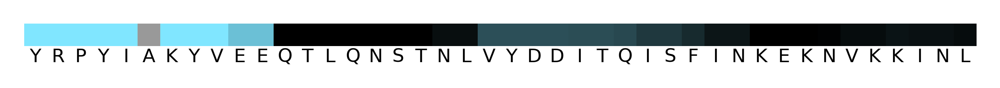

In [14]:
wt = 3574
pep_plasmids = list(range(3768,3782))
core_length=21
extract_df = da.sub_pivot_df(pep_plasmids + [wt], sldf, group=False)
wt_seq, ddgi_scores = da.ddgi(wt, extract_df)
dp.ddgi_heatmap(wt_seq, ddgi_scores, core_length=core_length)
plt.show()

# Generate scan matrix shown in Figure 1b and Supplementary Note 3

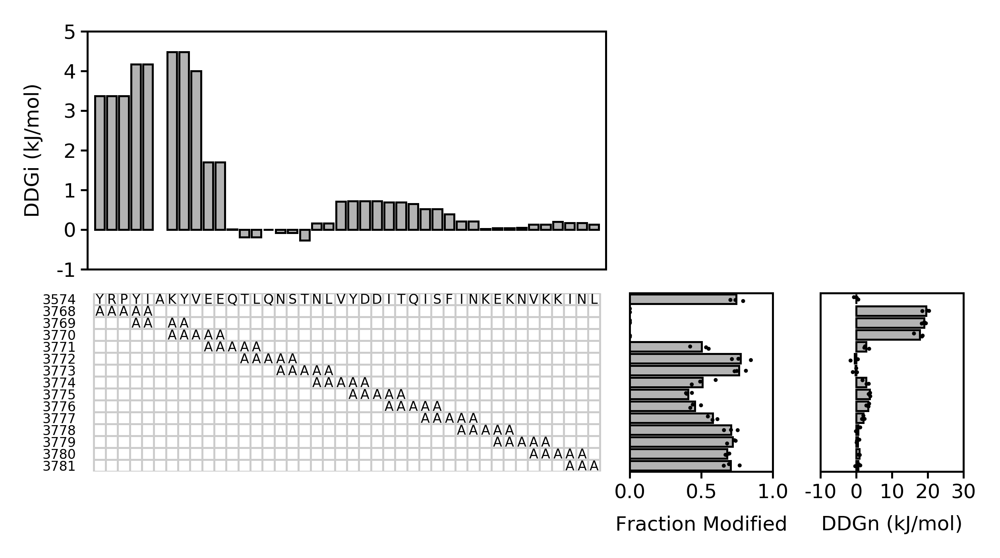

In [15]:
dp.alanine_block_plot(extract_df, wt_seq, ddgi_scores, core_length=core_length)
plt.show()

# Raw chromatogram/spectrum data for alanine scan variants (shown in Supplementary Figure 6)

In [32]:
pep_plasmids = [3574] + list(range(3768,3782))
dp.variant_raw_plots(pep_plasmids, sldf, save=False)
plt.show()

# Estimate spacing fit parameters

In [17]:
optimal = 3574
pep_plasmids = [3892,3893,3894,3895,3896,3902,3903,3904]
extract_df = da.sub_pivot_df(pep_plasmids + [optimal], sldf, group=False)
k1, k2 = dp.spring_plot(extract_df, optimal, plot=False, print_stats=True)

k1 110.28236021453318 k2 38.58320790321634


# Generate spacing plot shown in Figure 1f

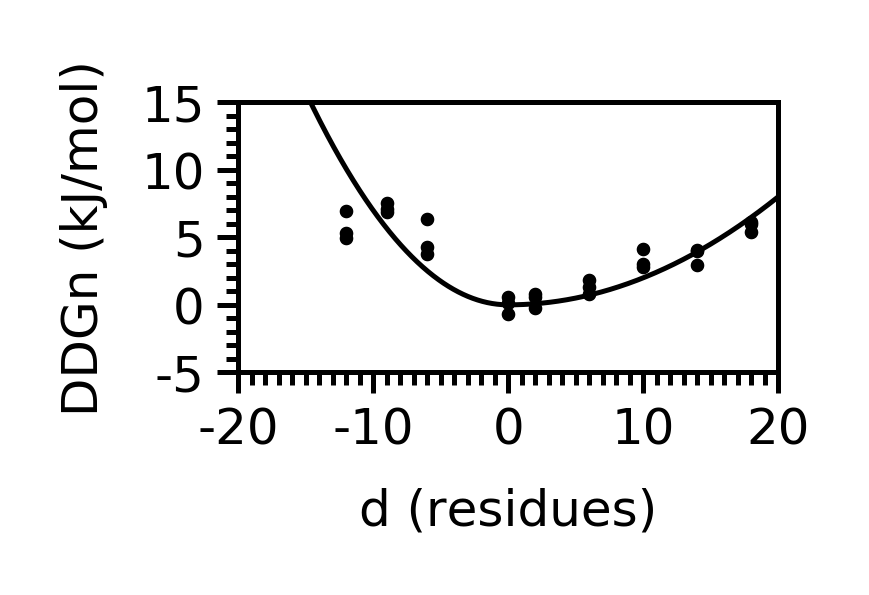

In [18]:
optimal = 3574
pep_plasmids = [3892,3893,3894,3895,3896,3902,3903,3904]
extract_df = da.sub_pivot_df(pep_plasmids + [optimal], sldf, group=False)
k1, k2 = dp.spring_plot(extract_df, optimal, k=(140,40), plot=True)
plt.show()

# Generate matrix of spacing variants shown in Figure 1c and Supplementary Note 3

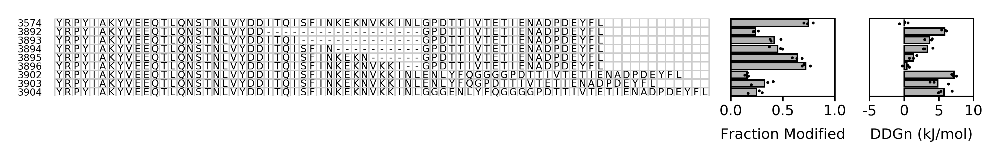

In [19]:
wt = 3574
pep_plasmids = [3892,3893,3894,3895,3896,3902,3903,3904]
extract_df = da.sub_pivot_df(pep_plasmids + [wt], sldf, group=False)
dp.alignment_plot(extract_df, wt)
plt.show()

# Generate matrix of truncations shown in Supplementary Note 3

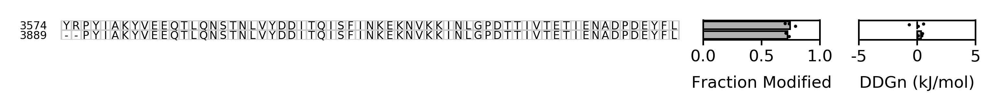

In [20]:
pep_plasmids = [3889]
extract_df = da.sub_pivot_df(pep_plasmids + [wt], sldf, group=False)
dp.alignment_plot(extract_df, wt)
plt.show()

# Raw chromatogram/spectrum data for deletion/spcaing variants (shown in Supplementary Figure 6)

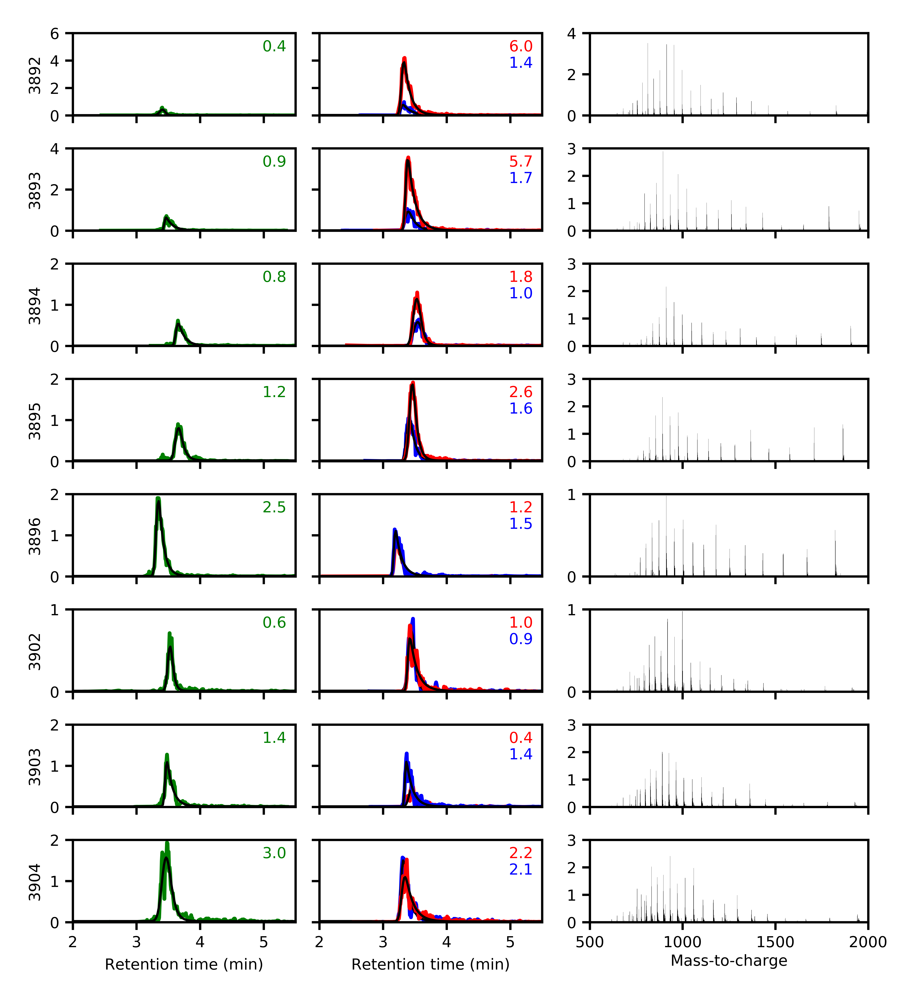

In [21]:
pep_plasmids = [3892,3893,3894,3895,3896,3902,3903,3904]
dp.variant_raw_plots(pep_plasmids, sldf, save=False)
plt.show()

# Generate single mutant core variant matrix shown in Figure 2a and Supplementary Note 3

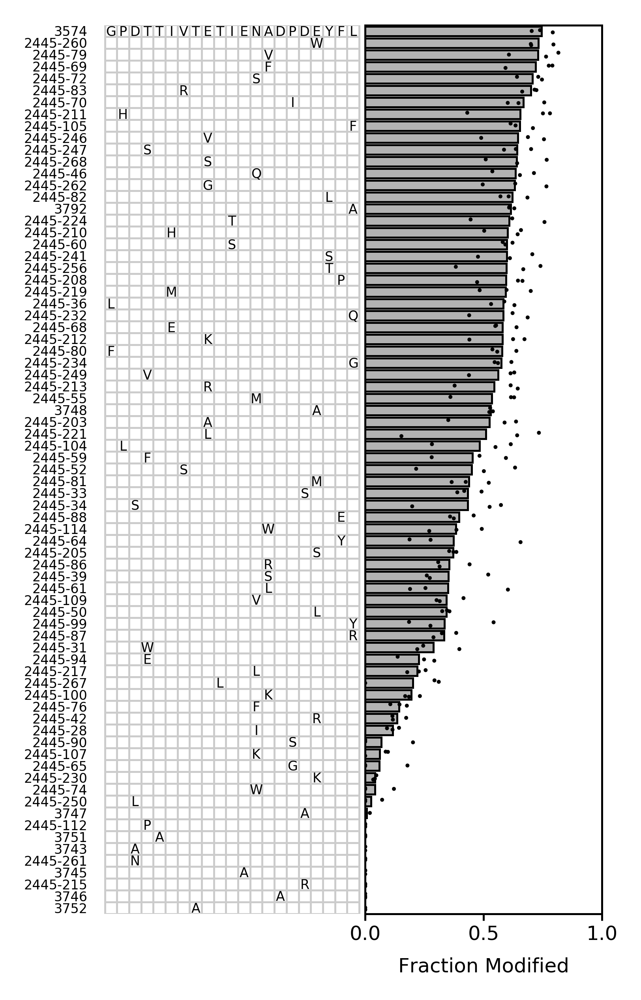

In [22]:
wt = 3574
leader = 'YRPYIAKYVEEQTLQNSTNLVYDDITQISFINKEKNVKKINL'
core = 'GPDTTIVTETIENADPDEYFL'
extract_df = da.grab_peptides(sldf, wt, core, leader=leader, mismatches=[1,1])
dp.core_matrix_plot(extract_df)
plt.show()

# Generate multi mutant core variant matrix shown in Supplementary Note 3

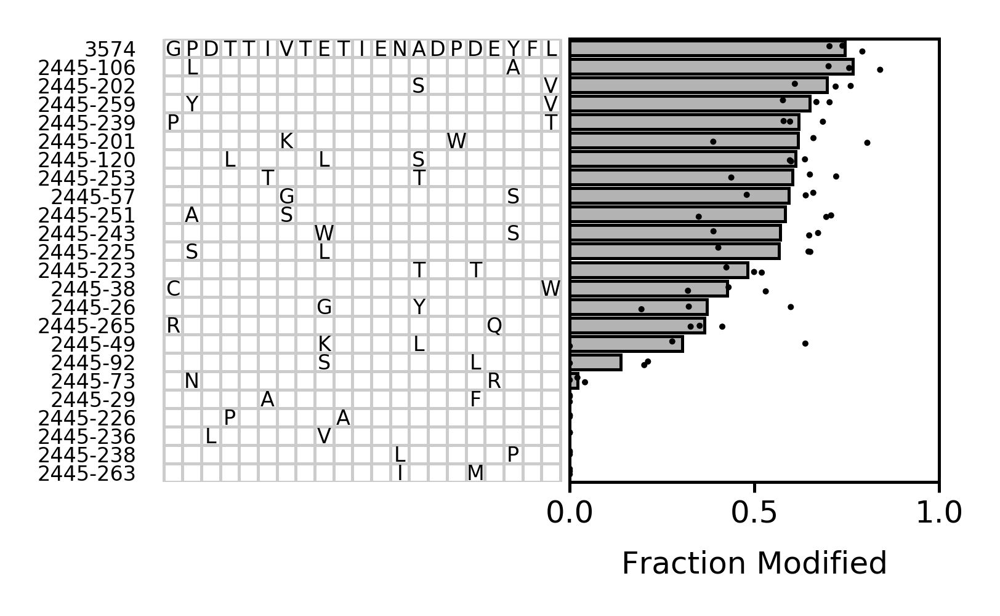

In [23]:
multi_extract_df = da.grab_peptides(sldf, wt, core, leader=leader, mismatches=[2,3])
dp.core_matrix_plot(multi_extract_df)
plt.show()

# Generate core motif shown in Figure 2b

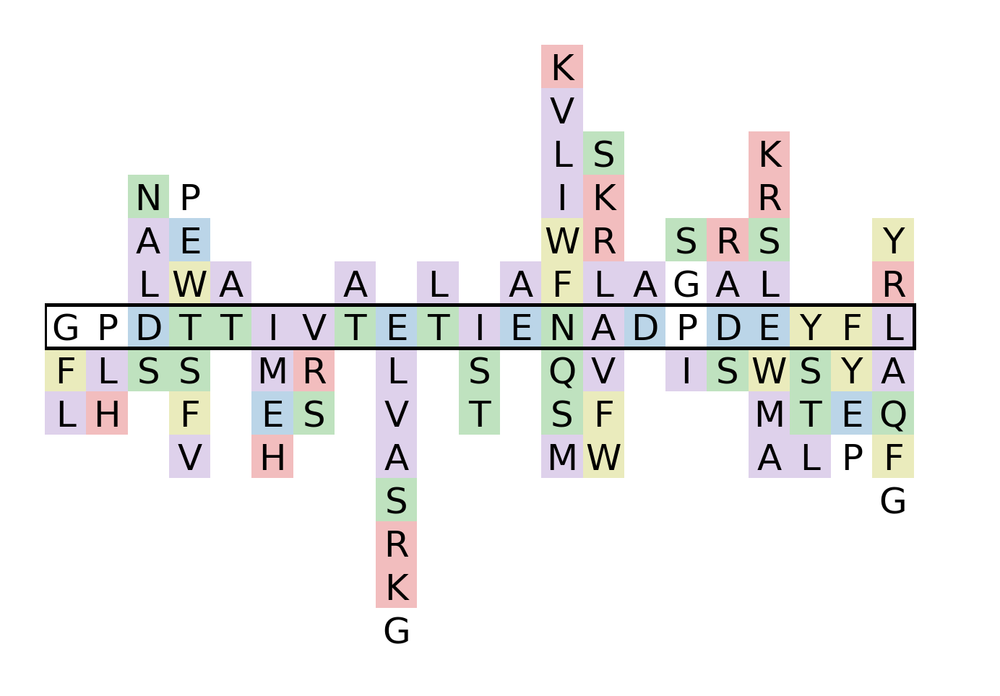

In [24]:
wt_core, gaa, baa = da.generate_motif(extract_df)
dp.motif_plot(wt_core, good_aas=gaa, bad_aas=baa)
plt.show()

# Raw chromatogram/spectrum data for core variants (shown in Supplementary Figure 6)

In [31]:
pep_plasmids = ['2445-100', '2445-104', '2445-105', '2445-107', '2445-109', '2445-112', '2445-114', '2445-203', '2445-205', '2445-208', '2445-210', '2445-211', '2445-212', '2445-213', '2445-215', '2445-217', '2445-219', '2445-221', '2445-224', '2445-230', '2445-232', '2445-234', '2445-241', '2445-246', '2445-247', '2445-249', '2445-250', '2445-256', '2445-260', '2445-261', '2445-262', '2445-267', '2445-268', '2445-28', '2445-31', '2445-33', '2445-34', '2445-36', '2445-39', '2445-42', '2445-46', '2445-50', '2445-52', '2445-55', '2445-59', '2445-60', '2445-61', '2445-64', '2445-65', '2445-68', '2445-69', '2445-70', '2445-72', '2445-74', '2445-76', '2445-79', '2445-80', '2445-81', '2445-82', '2445-83', '2445-86', '2445-87', '2445-88', '2445-90', '2445-94', '2445-99', '3574', '3743', '3745', '3746', '3747', '3748', '3751', '3752', '3792']
dp.variant_raw_plots(pep_plasmids, sldf, save = False, sort=True)
plt.show()